In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!pip install kaggle

# New Section

In [4]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"princesaiyan9","key":"31351eaeec63ffb94d779e7502f48c90"}'}

In [5]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d fivethirtyeight/uber-pickups-in-new-york-city
!unzip uber-pickups-in-new-york-city.zip -d ./uber_data

Dataset URL: https://www.kaggle.com/datasets/fivethirtyeight/uber-pickups-in-new-york-city
License(s): CC0-1.0
Archive:  uber-pickups-in-new-york-city.zip
  inflating: ./uber_data/Uber-Jan-Feb-FOIL.csv  
  inflating: ./uber_data/other-American_B01362.csv  
  inflating: ./uber_data/other-Carmel_B00256.csv  
  inflating: ./uber_data/other-Dial7_B00887.csv  
  inflating: ./uber_data/other-Diplo_B01196.csv  
  inflating: ./uber_data/other-FHV-services_jan-aug-2015.csv  
  inflating: ./uber_data/other-Federal_02216.csv  
  inflating: ./uber_data/other-Firstclass_B01536.csv  
  inflating: ./uber_data/other-Highclass_B01717.csv  
  inflating: ./uber_data/other-Lyft_B02510.csv  
  inflating: ./uber_data/other-Prestige_B01338.csv  
  inflating: ./uber_data/other-Skyline_B00111.csv  
  inflating: ./uber_data/uber-raw-data-apr14.csv  
  inflating: ./uber_data/uber-raw-data-aug14.csv  
  inflating: ./uber_data/uber-raw-data-janjune-15.csv  
  inflating: ./uber_data/uber-raw-data-jul14.csv  
  infl

Dataset Head:
          Date/Time      Lat      Lon    Base
0  4/1/2014 0:11:00  40.7690 -73.9549  B02512
1  4/1/2014 0:17:00  40.7267 -74.0345  B02512
2  4/1/2014 0:21:00  40.7316 -73.9873  B02512
3  4/1/2014 0:28:00  40.7588 -73.9776  B02512
4  4/1/2014 0:33:00  40.7594 -73.9722  B02512


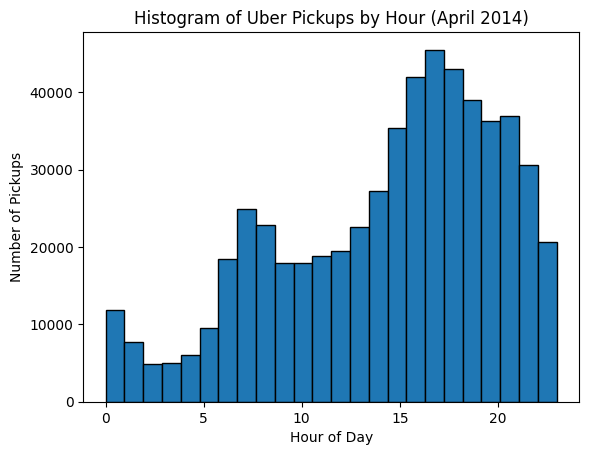

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

data_file = 'uber_data/uber-raw-data-apr14.csv'
df = pd.read_csv(data_file)

print("Dataset Head:")
print(df.head())

df['Date/Time'] = pd.to_datetime(df['Date/Time'])
df['hour'] = df['Date/Time'].dt.hour

plt.hist(df['hour'], bins=24, edgecolor='black')
plt.title('Histogram of Uber Pickups by Hour (April 2014)')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Pickups')
plt.show()

Dataset Head:
          Date/Time      Lat      Lon    Base
0  4/1/2014 0:11:00  40.7690 -73.9549  B02512
1  4/1/2014 0:17:00  40.7267 -74.0345  B02512
2  4/1/2014 0:21:00  40.7316 -73.9873  B02512
3  4/1/2014 0:28:00  40.7588 -73.9776  B02512
4  4/1/2014 0:33:00  40.7594 -73.9722  B02512

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 564516 entries, 0 to 564515
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Date/Time  564516 non-null  object 
 1   Lat        564516 non-null  float64
 2   Lon        564516 non-null  float64
 3   Base       564516 non-null  object 
dtypes: float64(2), object(2)
memory usage: 17.2+ MB
None

Dataset Summary Statistics:
                 Lat            Lon
count  564516.000000  564516.000000
mean       40.740005     -73.976817
std         0.036083       0.050426
min        40.072900     -74.773300
25%        40.722500     -73.997700
50%        40.742500     -73.984800


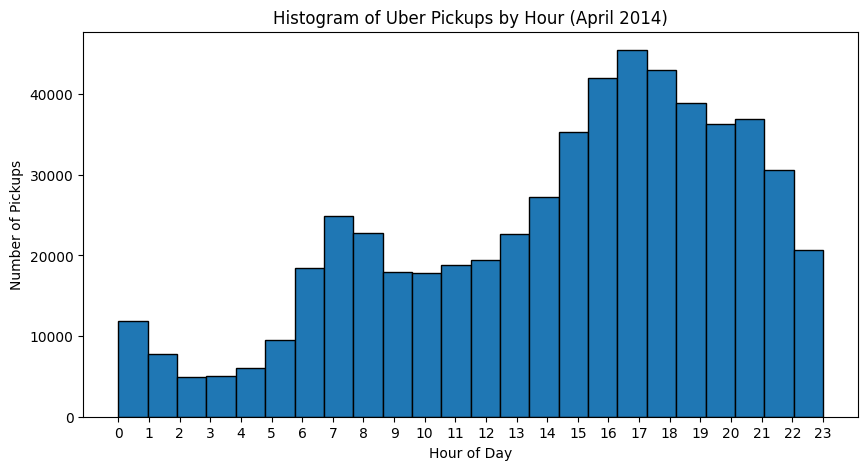

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

data_file = 'uber_data/uber-raw-data-apr14.csv'
df = pd.read_csv(data_file)

print("Dataset Head:")
print(df.head())
print("\nDataset Info:")
print(df.info())

print("\nDataset Summary Statistics:")
print(df.describe())

df['Date/Time'] = pd.to_datetime(df['Date/Time'])
df['hour'] = df['Date/Time'].dt.hour

plt.figure(figsize=(10, 5))
plt.hist(df['hour'], bins=24, edgecolor='black')
plt.title('Histogram of Uber Pickups by Hour (April 2014)')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Pickups')
plt.xticks(range(0, 24))
plt.show()

In [8]:
import pandas as pd

# Define file path for the 2015 Uber data file
uber_file = 'uber_data/uber-raw-data-janjune-15.csv'  # Adjust the path as necessary

# --- Extraction ---
# Load the Uber ride data into a DataFrame
uber_df = pd.read_csv(uber_file)

# --- Transformation ---
# Convert the 'Pickup_date' column to datetime format
uber_df['Pickup_date'] = pd.to_datetime(uber_df['Pickup_date'])

# Create a surrogate key for each ride using the DataFrame index
uber_df['RideID'] = uber_df.index + 1

# Ride Fact table by selecting and reordering relevant columns
ride_fact = uber_df[['RideID', 'Pickup_date', 'Dispatching_base_num', 'Affiliated_base_num', 'locationID']]

# Preview the transformed Ride Fact data
print("Transformed Ride Fact Data:")
print(ride_fact.head())

# --- Loading ---

output_file = 'uber_data/transformed_ride_fact.csv'
ride_fact.to_csv(output_file, index=False)
print(f"Transformed data saved to {output_file}")


Transformed Ride Fact Data:
   RideID         Pickup_date Dispatching_base_num Affiliated_base_num  \
0       1 2015-05-17 09:47:00               B02617              B02617   
1       2 2015-05-17 09:47:00               B02617              B02617   
2       3 2015-05-17 09:47:00               B02617              B02617   
3       4 2015-05-17 09:47:00               B02617              B02774   
4       5 2015-05-17 09:47:00               B02617              B02617   

   locationID  
0         141  
1          65  
2         100  
3          80  
4          90  
Transformed data saved to uber_data/transformed_ride_fact.csv


In [11]:
!pip install pyspark


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 317.2/317.2 MB 3.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 200.5/200.5 kB 15.4 MB/s eta 0:00:00
  Created wheel for pyspark: filename=pyspark-3.5.5-py2.py3-none-any.whl size=317747921 sha256=a172555b29e8470dca670f4f48188e0b1fe3b1bfea0ee978b613777bdc434393
  Stored in directory: /root/.cache/pip/wheels/0c/7f/b4/0e68c6d8d89d2e582e5498ad88616c16d7c19028680e9d3840
Successfully built pyspark


In [13]:
from pyspark.sql import SparkSession

# Initialize SparkSession
spark = SparkSession.builder.appName("UberRideAnalysis").getOrCreate()

# Load the transformed ride fact CSV file into a Spark DataFrame
ride_fact = spark.read.csv("uber_data/transformed_ride_fact.csv", header=True, inferSchema=True)

# Create a temporary view for Spark SQL queries
ride_fact.createOrReplaceTempView("ride_fact")


# Query 1: Total Number of Rides

total_rides = spark.sql("""
    SELECT COUNT(*) AS total_rides
    FROM ride_fact
""")
total_rides.show()


# Query 2: Rides by Dispatching Base

rides_by_base = spark.sql("""
    SELECT dispatching_base_num, COUNT(*) AS ride_count
    FROM ride_fact
    GROUP BY dispatching_base_num
""")
rides_by_base.show()


# Query 3: Rides Per Day


rides_per_day = spark.sql("""
    SELECT DATE(pickup_date) AS ride_date, COUNT(*) AS ride_count
    FROM ride_fact
    GROUP BY DATE(pickup_date)
    ORDER BY ride_date
""")
rides_per_day.show()


# Query 4: Rides by Hour of the Day


rides_by_hour = spark.sql("""
    SELECT hour(pickup_date) AS ride_hour, COUNT(*) AS ride_count
    FROM ride_fact
    GROUP BY hour(pickup_date)
    ORDER BY ride_hour
""")
rides_by_hour.show()


# Query 5: Rides by LocationID
rides_by_location = spark.sql("""
    SELECT locationid AS location_id, COUNT(*) AS ride_count
    FROM ride_fact
    GROUP BY locationid
    ORDER BY ride_count DESC
""")
rides_by_location.show()


# Query 6: Average Number of Rides Per Day

avg_rides_per_day = spark.sql("""

    SELECT AVG(daily_count) AS avg_rides_per_day
    FROM (
        SELECT DATE(pickup_date) AS ride_date, COUNT(*) AS daily_count
        FROM ride_fact
        GROUP BY DATE(pickup_date)
    ) tmp
""")
avg_rides_per_day.show()


+-----------+
|total_rides|
+-----------+
|   14270479|
+-----------+

+--------------------+----------+
|dispatching_base_num|ride_count|
+--------------------+----------+
|              B02598|   1526660|
|              B02682|   3484530|
|              B02617|   2068525|
|              B02764|   5753653|
|              B02512|    255772|
|              B02765|   1152727|
|              B02835|     26622|
|              B02836|      1990|
+--------------------+----------+

+----------+----------+
| ride_date|ride_count|
+----------+----------+
|2015-01-01|     58045|
|2015-01-02|     40287|
|2015-01-03|     59844|
|2015-01-04|     41943|
|2015-01-05|     43678|
|2015-01-06|     53539|
|2015-01-07|     63375|
|2015-01-08|     73016|
|2015-01-09|     72124|
|2015-01-10|     80656|
|2015-01-11|     58751|
|2015-01-12|     58991|
|2015-01-13|     64765|
|2015-01-14|     64725|
|2015-01-15|     68211|
|2015-01-16|     74193|
|2015-01-17|     75364|
|2015-01-18|     74523|
|2015-01-19|    

In [14]:
#let usd give the a
from pyspark.sql.functions import rand, round

# Add a 'revenue' column with random values between 10 and 25
ride_fact_with_revenue = ride_fact.withColumn("revenue", round(10 + (rand() * 15), 2))

# Create a temporary view so we can query using Spark SQL
ride_fact_with_revenue.createOrReplaceTempView("ride_fact_with_revenue")

# Preview the data with the new revenue column
ride_fact_with_revenue.show(5)


+------+-------------------+--------------------+-------------------+----------+-------+
|RideID|        Pickup_date|Dispatching_base_num|Affiliated_base_num|locationID|revenue|
+------+-------------------+--------------------+-------------------+----------+-------+
|     1|2015-05-17 09:47:00|              B02617|             B02617|       141|  23.69|
|     2|2015-05-17 09:47:00|              B02617|             B02617|        65|  12.54|
|     3|2015-05-17 09:47:00|              B02617|             B02617|       100|  19.48|
|     4|2015-05-17 09:47:00|              B02617|             B02774|        80|  19.28|
|     5|2015-05-17 09:47:00|              B02617|             B02617|        90|  13.57|
+------+-------------------+--------------------+-------------------+----------+-------+
only showing top 5 rows



In [15]:
from pyspark.sql.functions import rand, round

# Add a 'revenue' column with random values between 10 and 25
ride_fact_with_revenue = ride_fact.withColumn("revenue", round(10 + (rand() * 15), 2))

# Preview the data with the new revenue column
ride_fact_with_revenue.show(5)



+------+-------------------+--------------------+-------------------+----------+-------+
|RideID|        Pickup_date|Dispatching_base_num|Affiliated_base_num|locationID|revenue|
+------+-------------------+--------------------+-------------------+----------+-------+
|     1|2015-05-17 09:47:00|              B02617|             B02617|       141|  24.26|
|     2|2015-05-17 09:47:00|              B02617|             B02617|        65|  11.56|
|     3|2015-05-17 09:47:00|              B02617|             B02617|       100|  13.17|
|     4|2015-05-17 09:47:00|              B02617|             B02774|        80|   17.8|
|     5|2015-05-17 09:47:00|              B02617|             B02617|        90|  17.72|
+------+-------------------+--------------------+-------------------+----------+-------+
only showing top 5 rows



In [16]:
from pyspark.sql.functions import max as spark_max, col

# Group by 'locationid' and compute the maximum revenue for each location
max_revenue_by_location = ride_fact_with_revenue.groupBy("locationid") \
    .agg(spark_max("revenue").alias("max_revenue"))

# Order the result in descending order of max revenue and show the result
max_revenue_by_location.orderBy(col("max_revenue").desc()).show()

+----------+-----------+
|locationid|max_revenue|
+----------+-----------+
|       210|       25.0|
|       232|       25.0|
|       243|       25.0|
|       225|       25.0|
|        76|       25.0|
|       137|       25.0|
|        26|       25.0|
|        65|       25.0|
|       192|       25.0|
|       133|       25.0|
|       159|       25.0|
|       108|       25.0|
|       253|       25.0|
|       211|       25.0|
|       236|       25.0|
|        34|       25.0|
|        12|       25.0|
|       101|       25.0|
|       223|       25.0|
|       148|       25.0|
+----------+-----------+
only showing top 20 rows



In [17]:
!pip install folium


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.9/110.9 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.4/88.4 kB 5.7 MB/s eta 0:00:00


In [18]:
import pandas as pd
import folium
from folium.plugins import HeatMap

# Load the 2014 Uber dataset (make sure this file is in your 'uber_data' folder)
data_file = 'uber_data/uber-raw-data-apr14.csv'
df = pd.read_csv(data_file)

# Display the first few rows to confirm the data contains 'Lat' and 'Lon'
print(df.head())

# Create a base map centered over New York City (approximate center)
base_map = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

# Prepare the data for the heat map: a list of [latitude, longitude] pairs.
heat_data = df[['Lat', 'Lon']].values.tolist()

# Create the HeatMap layer and add it to the base map
HeatMap(heat_data, radius=8).add_to(base_map)

# Display the map
base_map


          Date/Time      Lat      Lon    Base
0  4/1/2014 0:11:00  40.7690 -73.9549  B02512
1  4/1/2014 0:17:00  40.7267 -74.0345  B02512
2  4/1/2014 0:21:00  40.7316 -73.9873  B02512
3  4/1/2014 0:28:00  40.7588 -73.9776  B02512
4  4/1/2014 0:33:00  40.7594 -73.9722  B02512


In [19]:
import pandas as pd
import numpy as np
import folium
from folium.plugins import HeatMap

# Load the 2014 Uber dataset (ensure the CSV file is in your 'uber_data' folder)
data_file = 'uber_data/uber-raw-data-apr14.csv'
df = pd.read_csv(data_file)

# Display the first few rows to confirm the data contains 'Lat' and 'Lon'
print(df.head())

# Simulate a 'revenue' column with random values between $10 and $25
df['revenue'] = np.round(10 + np.random.rand(len(df)) * 15, 2)

# Define a threshold for more costly rides (e.g., rides with revenue >= $20)
threshold = 20
expensive_rides = df[df['revenue'] >= threshold]

print("Number of expensive rides:", expensive_rides.shape[0])

# Create a base map centered over New York City
base_map = folium.Map(location=[40.7128, -74.0060], zoom_start=12)

# Prepare heat map data: list of [latitude, longitude] pairs from the expensive rides
heat_data = expensive_rides[['Lat', 'Lon']].dropna().values.tolist()

# Create the HeatMap layer and add it to the base map
HeatMap(heat_data, radius=8).add_to(base_map)

# Display the map
base_map


          Date/Time      Lat      Lon    Base
0  4/1/2014 0:11:00  40.7690 -73.9549  B02512
1  4/1/2014 0:17:00  40.7267 -74.0345  B02512
2  4/1/2014 0:21:00  40.7316 -73.9873  B02512
3  4/1/2014 0:28:00  40.7588 -73.9776  B02512
4  4/1/2014 0:33:00  40.7594 -73.9722  B02512
Number of expensive rides: 188151


          Date/Time      Lat      Lon    Base
0  4/1/2014 0:11:00  40.7690 -73.9549  B02512
1  4/1/2014 0:17:00  40.7267 -74.0345  B02512
2  4/1/2014 0:21:00  40.7316 -73.9873  B02512
3  4/1/2014 0:28:00  40.7588 -73.9776  B02512
4  4/1/2014 0:33:00  40.7594 -73.9722  B02512
Maximum Revenue by Base Code:
     Base  revenue
0  B02512     25.0
1  B02598     25.0
2  B02617     25.0
3  B02682     25.0
4  B02764     25.0


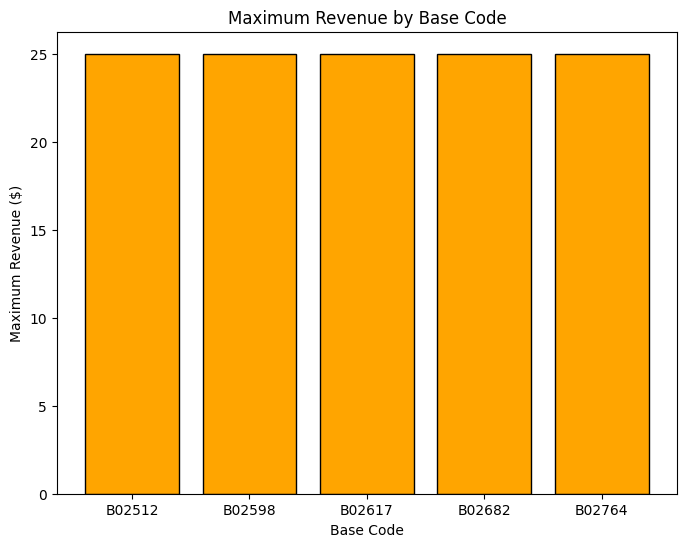

In [20]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the 2014 Uber dataset (ensure the file is in your 'uber_data' folder)
data_file = 'uber_data/uber-raw-data-apr14.csv'
df = pd.read_csv(data_file)

# Check the first few rows to confirm the presence of 'Base'
print(df.head())

# Simulate a 'revenue' column with random values between $10 and $25
df['revenue'] = np.round(10 + np.random.rand(len(df)) * 15, 2)

# Group by 'Base' and compute the maximum revenue for each base code
max_revenue_by_base = df.groupby('Base')['revenue'].max().reset_index()

print("Maximum Revenue by Base Code:")
print(max_revenue_by_base)

# Create a bar plot of the maximum revenue by base code
plt.figure(figsize=(8,6))
plt.bar(max_revenue_by_base['Base'], max_revenue_by_base['revenue'], color='orange', edgecolor='black')
plt.xlabel("Base Code")
plt.ylabel("Maximum Revenue ($)")
plt.title("Maximum Revenue by Base Code")
plt.show()


In [21]:
from pyspark.sql.functions import col

# Assuming 'ride_fact_with_revenue' DataFrame is already created with the simulated revenue column.
# Sort rides by revenue in descending order and limit to top 50.
top50_rides = ride_fact_with_revenue.orderBy(col("revenue").desc()).limit(50)

# Select key columns to display: RideID, pickup_date, Dispatching_base_num, locationid, and revenue.
top50_rides.select("RideID", "Pickup_date", "Dispatching_base_num", "locationid", "revenue").show(50, truncate=False)


+--------+-------------------+--------------------+----------+-------+
|RideID  |Pickup_date        |Dispatching_base_num|locationid|revenue|
+--------+-------------------+--------------------+----------+-------+
|14222429|2015-05-07 15:07:00|B02765              |107       |25.0   |
|7242047 |2015-02-04 00:29:30|B02764              |161       |25.0   |
|9226088 |2015-03-28 23:46:00|B02617              |190       |25.0   |
|7244680 |2015-04-25 19:14:00|B02598              |158       |25.0   |
|4404780 |2015-03-13 16:16:00|B02598              |236       |25.0   |
|7247012 |2015-06-04 19:24:00|B02764              |137       |25.0   |
|9199045 |2015-01-30 20:59:14|B02764              |244       |25.0   |
|7247029 |2015-06-04 19:24:00|B02764              |170       |25.0   |
|11450606|2015-03-10 17:38:00|B02764              |113       |25.0   |
|7248495 |2015-03-08 13:27:00|B02617              |211       |25.0   |
|9201260 |2015-01-16 12:17:58|B02764              |4         |25.0   |
|72486

In [22]:
!pip install confluent_kafka flask requests


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 41.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 103.0/103.0 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 15.8 MB/s eta 0:00:00
  Attempting uninstall: blinker
    Found existing installation: blinker 1.4
error: uninstall-distutils-installed-package

× Cannot uninstall blinker 1.4
╰─> It is a distutils installed project and thus we cannot accurately determine which files belong to it which would lead to only a partial uninstall.


In [ ]:
from confluent_kafka import Producer
import json
import time
import random

# Configure Kafka producer
producer_conf = {
    'bootstrap.servers': 'localhost:9092'
}
producer = Producer(producer_conf)
topic = 'ride_data'

def delivery_report(err, msg):
    """Called once for each message produced to indicate delivery result."""
    if err:
        print(f"Delivery failed: {err}")
    else:
        print(f"Message delivered to {msg.topic()} [{msg.partition()}]")

# Simulate streaming ride data
while True:
    ride_data = {
        'ride_id': random.randint(1000, 9999),
        'pickup_time': time.strftime("%Y-%m-%d %H:%M:%S"),
        'dispatching_base': random.choice(['B02512', 'B02598', 'B02617']),
        'revenue': __builtins__.round(10 + random.random() * 15, 2)
    }
    producer.produce(topic, json.dumps(ride_data).encode('utf-8'), callback=delivery_report)
    producer.poll(0)
    time.sleep(1)  # simulate 1 ride per second

producer.flush()


In [ ]:
from flask import Flask, request, jsonify
import time
import threading

app = Flask(__name__)

class TokenBucket:
    def __init__(self, capacity, refill_rate):
        self.capacity = capacity       # Maximum tokens in the bucket
        self.tokens = capacity         # Current tokens
        self.refill_rate = refill_rate # Tokens added per second
        self.lock = threading.Lock()
        self.last_refill = time.time()

    def allow_request(self):
        with self.lock:
            now = time.time()
            # Calculate tokens to add
            tokens_to_add = (now - self.last_refill) * self.refill_rate
            self.tokens = min(self.capacity, self.tokens + tokens_to_add)
            self.last_refill = now

            if self.tokens >= 1:
                self.tokens -= 1
                return True
            else:
                return False

# Create a token bucket with capacity 10 tokens and refill rate of 1 token per second
token_bucket = TokenBucket(capacity=10, refill_rate=1)

@app.route('/api/rides', methods=['GET'])
def get_rides():
    if token_bucket.allow_request():
        # Process the API request (simulate fetching ride data)
        response = {"status": "success", "message": "Ride data returned."}
        return jsonify(response)
    else:
        return jsonify({"status": "error", "message": "Rate limit exceeded. Please try again later."}), 429

if __name__ == '__main__':
    app.run(debug=True, port=5000)
